## Reading the data

In [1]:
import pandas as pd
import numpy as np
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE


df = pd.read_csv("../../corpus_sprint3_balanced_cleaned_all.csv", encoding="utf-8")
df = df.dropna()
print(df)
print(df.shape)

model = Doc2Vec.load("../../model_doc2vec_balanced_20epochs")

                                                Product  \
0             Payday loan, title loan, or personal loan   
1             Payday loan, title loan, or personal loan   
2                                 Vehicle loan or lease   
3     Money transfer, virtual currency, or money ser...   
4             Payday loan, title loan, or personal loan   
...                                                 ...   
9405                        Checking or savings account   
9406                            Bank account or service   
9407                            Bank account or service   
9408                            Bank account or service   
9409                            Bank account or service   

                           Sub-product  \
0                     Installment loan   
1                     Installment loan   
2                                 Loan   
3                      Debt settlement   
4                          Payday loan   
...                                ... 

## One hot encoding and concatenating

In [2]:
vectors = model.docvecs.vectors_docs

In [3]:

one_hot = pd.Categorical(df['Issue'])
df_dummies = pd.get_dummies(one_hot)

one_hot2 = pd.Categorical(df['Sub-issue'])
df_dummies2 = pd.get_dummies(one_hot2)

one_hot3 = pd.Categorical(df['Product'])
df_dummies3 = pd.get_dummies(one_hot3)

one_hot4 = pd.Categorical(df['Sub-product'])
df_dummies4 = pd.get_dummies(one_hot4)

v_df = pd.DataFrame(vectors)
df_concat = pd.concat([v_df, df_dummies, df_dummies2, df_dummies3, df_dummies4], axis = 1)
print(df_concat.shape)

(9410, 145)


## Applying T-SNE

In [4]:
tsne = TSNE(n_components=2)
data_reduced = tsne.fit_transform(df_concat)


In [5]:
print(data_reduced.shape)

(9410, 2)


## Applying k-means

In [6]:
from sklearn.cluster import KMeans
from sklearn import metrics

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49


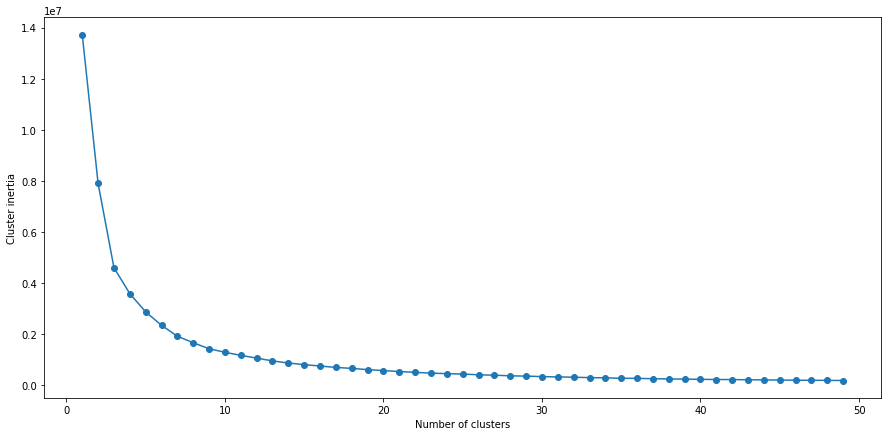

In [7]:
inertia = []
k_min=1
k_max=50
for i in range(k_min, k_max):
    print(i)
    km = KMeans(n_clusters=i,init='k-means++')
    km.fit(data_reduced)
    inertia.append(km.inertia_)
plt.rcParams['figure.figsize'] = [15,7]
plt.plot(range(k_min,k_max), inertia,marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Cluster inertia')
plt.show()

## Silhouette scores

For n_clusters = 4 The average silhouette_score is : 0.41444203
For n_clusters = 5 The average silhouette_score is : 0.37899473
For n_clusters = 6 The average silhouette_score is : 0.39887998
For n_clusters = 7 The average silhouette_score is : 0.40643048
For n_clusters = 8 The average silhouette_score is : 0.41183105
For n_clusters = 9 The average silhouette_score is : 0.42146823
For n_clusters = 10 The average silhouette_score is : 0.42793632
For n_clusters = 11 The average silhouette_score is : 0.4191467
For n_clusters = 12 The average silhouette_score is : 0.41736096
For n_clusters = 13 The average silhouette_score is : 0.4279088
For n_clusters = 14 The average silhouette_score is : 0.43557623
For n_clusters = 15 The average silhouette_score is : 0.43456987
For n_clusters = 16 The average silhouette_score is : 0.44257802
For n_clusters = 17 The average silhouette_score is : 0.4373865
For n_clusters = 18 The average silhouette_score is : 0.44429547
For n_clusters = 19 The average si

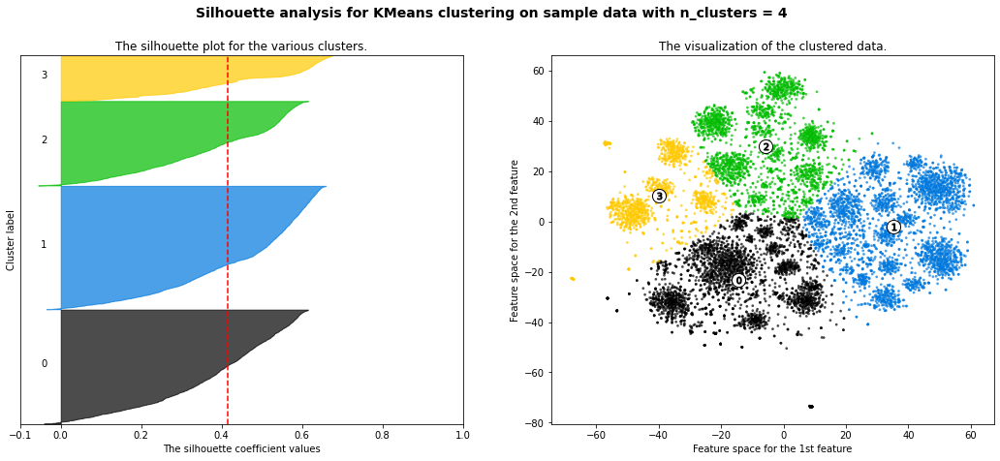

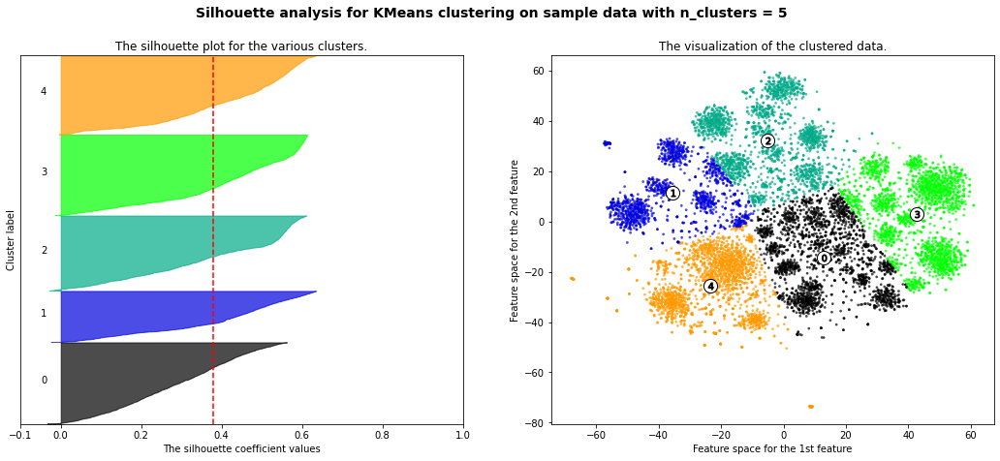

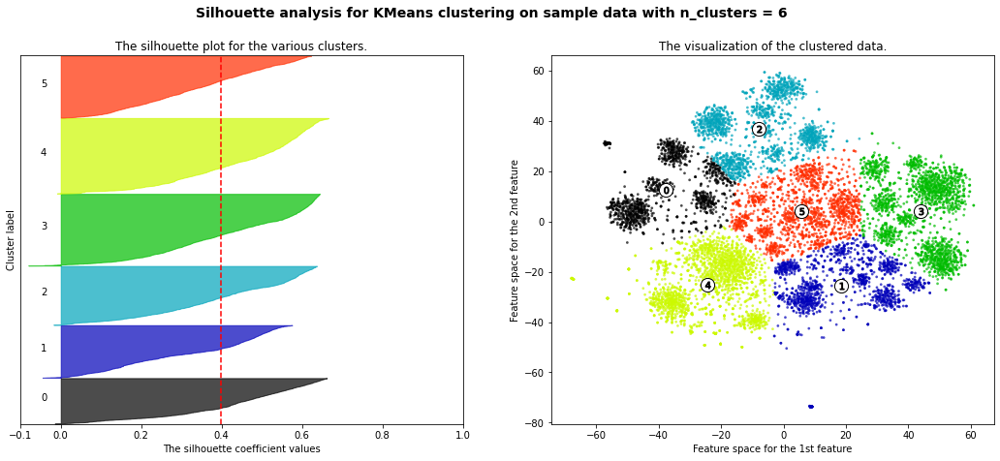

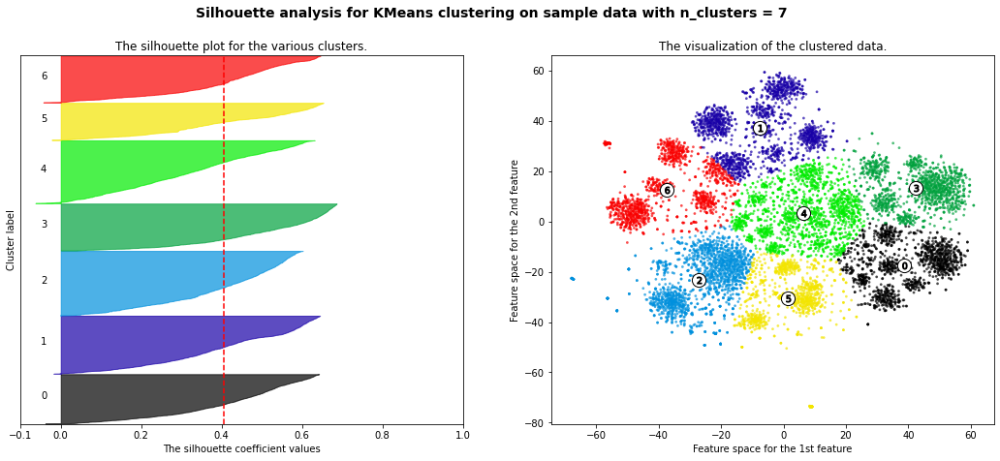

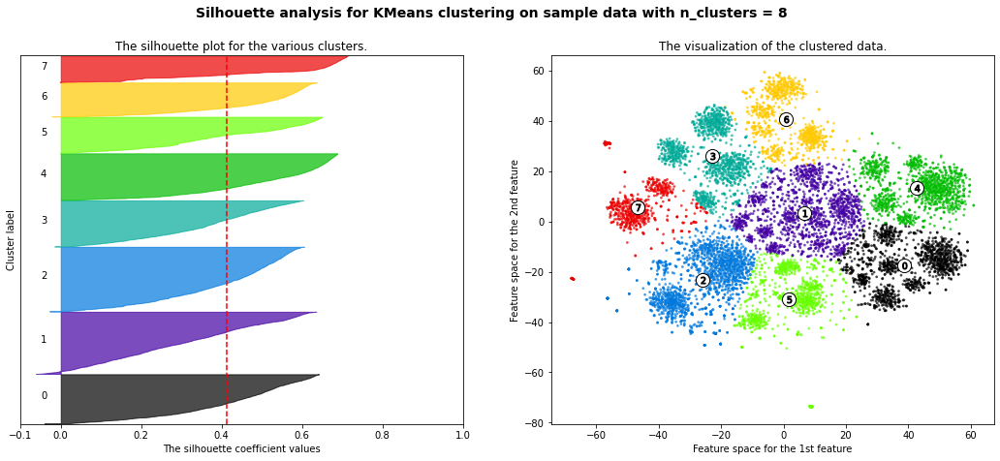

...

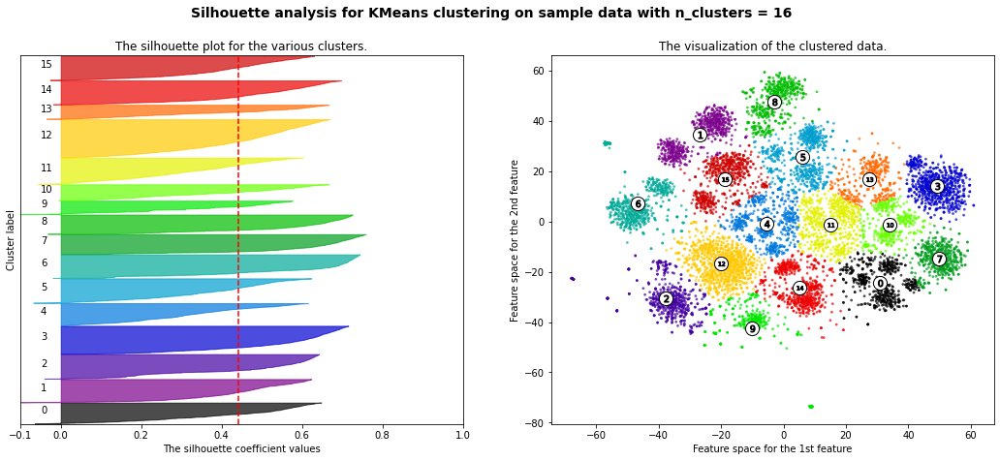

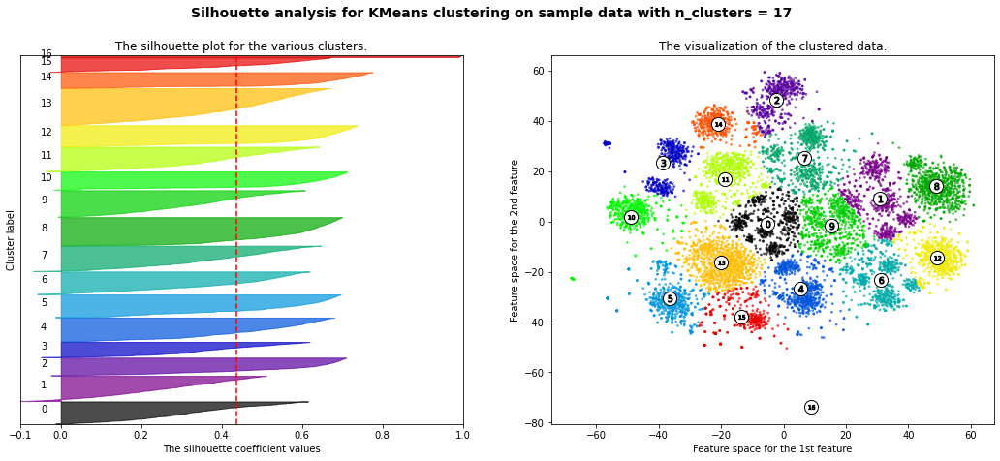

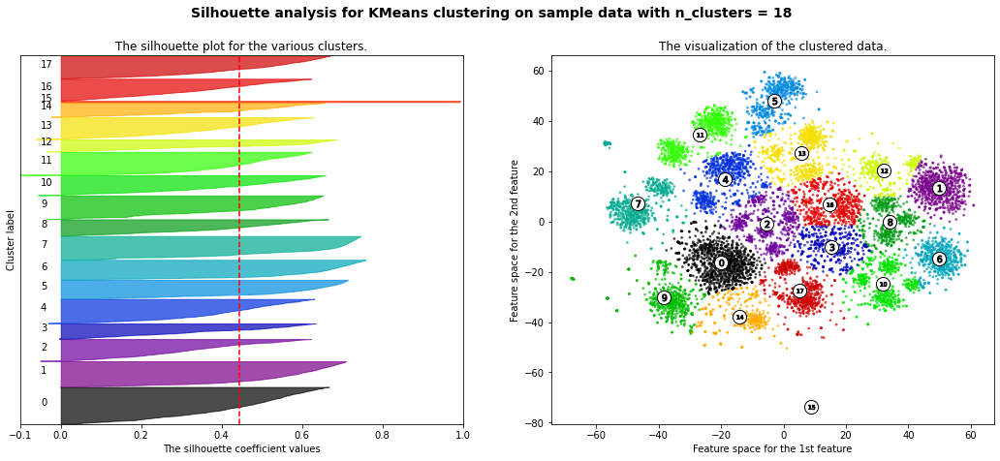

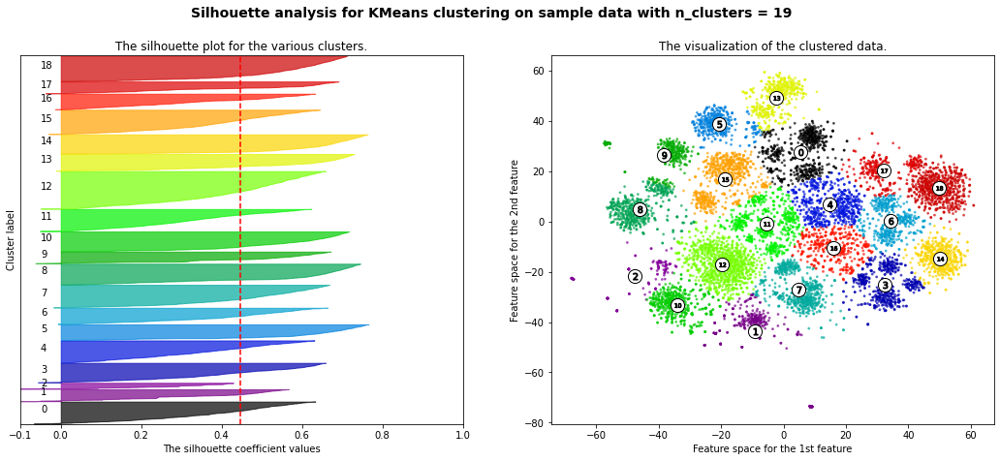

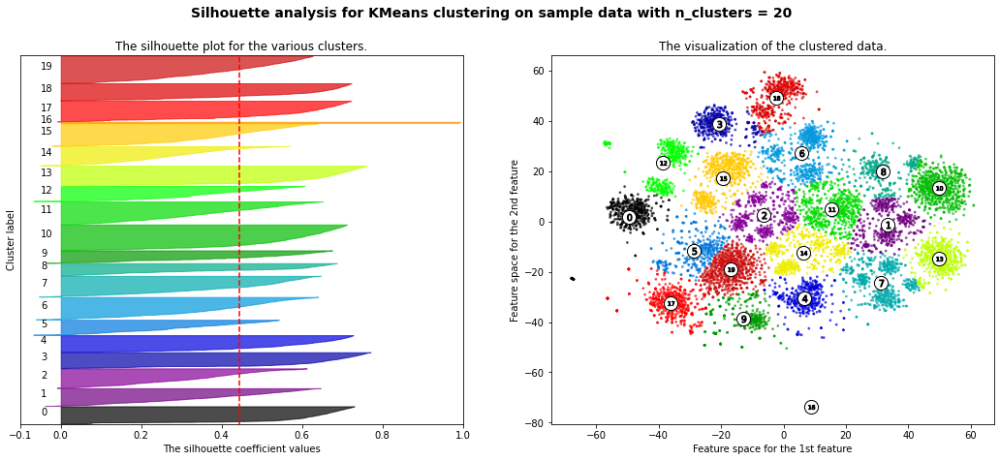

In [11]:
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

for n_clusters in range(4,21):
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(data_reduced) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(data_reduced)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(data_reduced, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(data_reduced, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(data_reduced[:, 0], data_reduced[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

## Analyzing with narrative

In [8]:
number_clusters = 20
km = KMeans(n_clusters=number_clusters,init='k-means++')
indexes = km.fit_predict(data_reduced)
centroids = km.cluster_centers_

#v_df = pd.DataFrame(vectors)
df_result = pd.concat([df, pd.DataFrame(indexes)], axis = 1)
print(df_result)

                                                Product  \
0             Payday loan, title loan, or personal loan   
1             Payday loan, title loan, or personal loan   
2                                 Vehicle loan or lease   
3     Money transfer, virtual currency, or money ser...   
4             Payday loan, title loan, or personal loan   
...                                                 ...   
9405                        Checking or savings account   
9406                            Bank account or service   
9407                            Bank account or service   
9408                            Bank account or service   
9409                            Bank account or service   

                           Sub-product  \
0                     Installment loan   
1                     Installment loan   
2                                 Loan   
3                      Debt settlement   
4                          Payday loan   
...                                ... 

Cluster number: 0
i recently had financial difficulties in which i let know ahead of time. i sent in all my paperwork but they kept telling it was wrong. which was not the case. it seemed like they were doing this on purpose to cause me to almost go into foreclosure they even sent me documents for modification on date that was scheduled after i received the papers. they cause more of a hardship than it should have been. so i decided to go throw which took 30 days. put me in bind to ruin my credit it took 4 months for them to get everything together which is entirely unacceptable for banking standards. so they re showing late on my credit profile in error this was merely their mistake. i did all i was supposed to do ... not to mention i was misguided via one of their employees who advised me not to pay any mortgage until i see if i m going to get approved for the hardship. i have attached a letter that i provide in 

i hate you experin your not fair with me you have my police report and

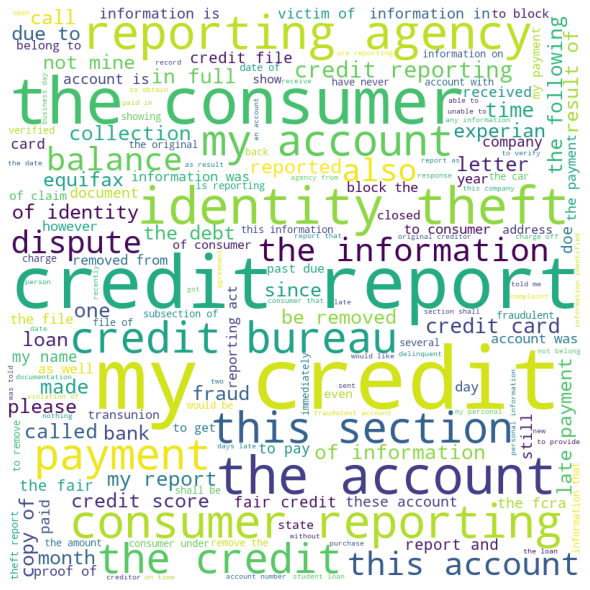

Cluster number: 1
i have been trying to open a checking account in chase bank for my daughter and failed. we are green card holders and my daughter has only a tin and doesn t have a ssn. after almost two months of back and forth in which the bank said they have a technical issue - since the first week of xx/xx/ - the bank says now that this is a policy decision and that they do not allow green card holders to open an account if they don t have a ssn.i know that even foreigners can open an account in the us with a tin and i think it is discriminatory for the bank not to allow my daughter to have an account just because she has a green card and a tin and no ssn yet. the bank would not even speak to me anymore about this at this point.

Number of entries: 501


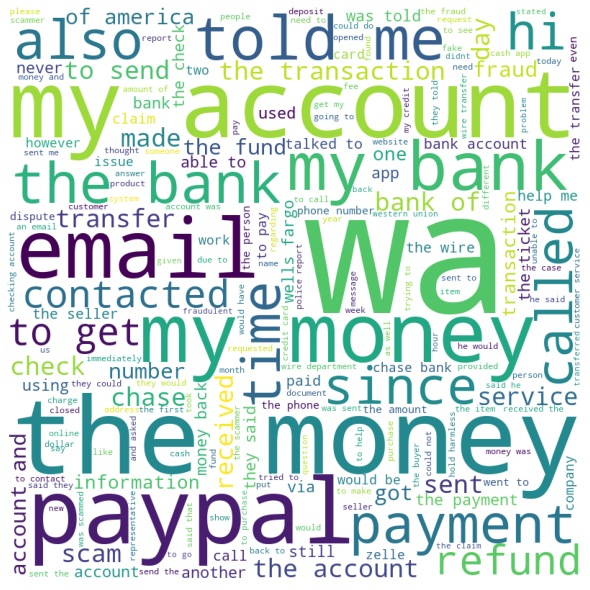

Cluster number: 2
new car loan with ford credit early . i made first payment and requested ammortization schedule for the loan. ford is refusing to provide this.

i called ally financial inc today  regarding a discrepancy with my outstanding balance of my car loan. i advised the balance reflected on my account was 4700.00 short of what i paid. the representative was agreed with me after doing the math together and consulted his supervisor. he cam back on the phone and proceeded to tell me that because my payments were not made by their due date of the of the month that they were allowed to raise my interest rate to over 50 . when i advised that his explanation doesn t sound legal he began to tell me he could no longer help me and disconnected the call.

Number of entries: 470


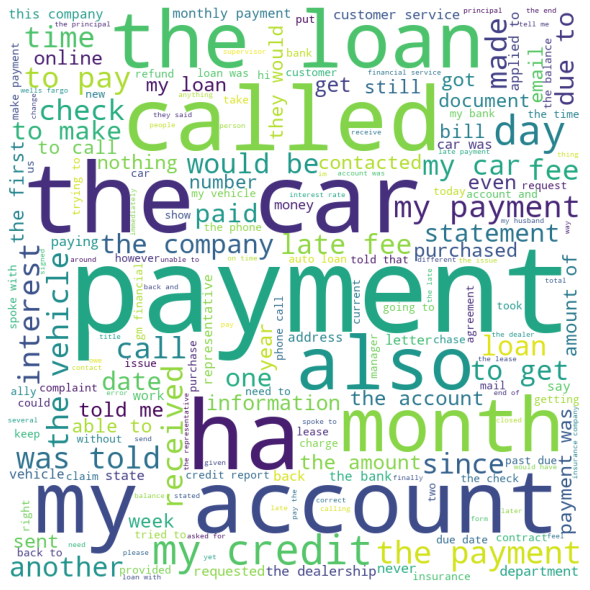

Cluster number: 3
i have a master card associated with my business account with bank of america. i ve been paying the minimum payment or more to keep my account in good standing. i decided in  to pay off this card due to high interest rate. for two statements following the full payment i noticed that the bank is still charging me a finance charge at even a higher rate on a balance account.i contacted the bank of american customer service to see why i m being charged a finance charge on a balance. they told me that they do so for the two months following the full payment. this didn t make any sense. i asked to speak to a supervisor and they declined to speak to me. they even charged me a cash finance charge when i never take out cash on any of my credit cards.i believe the bank is over charging me and trying to make money on a balance. i would like this issue to be investigated and hope to resolve it with removing these charges from my account.

Number of entries: 610


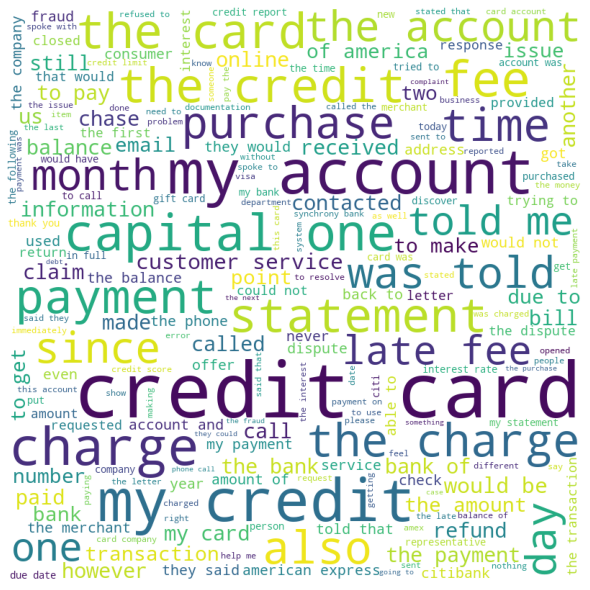

Cluster number: 4
regards to navient and a statement they made in an article these documents clearly show that navient educates our borrowers about income-driven and other repayment options any suggestion otherwise is a distortion of the facts general counsel for navient told the . after a nearly six-year legal process the cfpb has failed to produce a single student loan borrower to support their baseless claims against navient. they pushed me into forbearance and also their income driven program is a sham. they tried to state that all calculations called for 600+ dollars a month. this was out of control.

i was notified this morning  that i have a student loan payment of over 400.00 due on the . 8 day notice which is actually 6 business days of notice. this is atrocious and unacceptable. how am i supposed to come up with that money on the fly right before the holiday and right around the holiday season i have at this time requested a forbearance due to my financial situation but this 

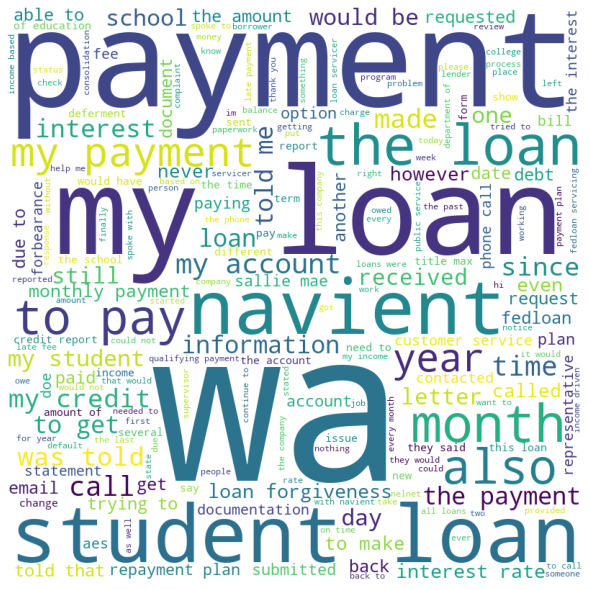

Cluster number: 5
dear madam or sir i am writing a formal notice of dispute and a notice of violations pertaining to specialized loan servicing denying me my 30 day legal right to dispute and appeal for a modification and the illegal actions of specialized loan servicing pertaining to my primary residence located at wa and loan . on several occasions during my phone calls with specialized loan servicing sls for updates and reviews i was told in uncertain terms from sls representatives that i only had until a  deadline to submit my appeal/dispute letter into their department for review. i have had to explain to these sls representatives that i didnt receive their letter of denial until i had requested a sls representative to fax it to me on  since it was never mailed out and this was the first i had heard about the denial! once i received this denial it didnt state any details of how i was denied what information was used by sls to come to their conclusion. i have a right to check these

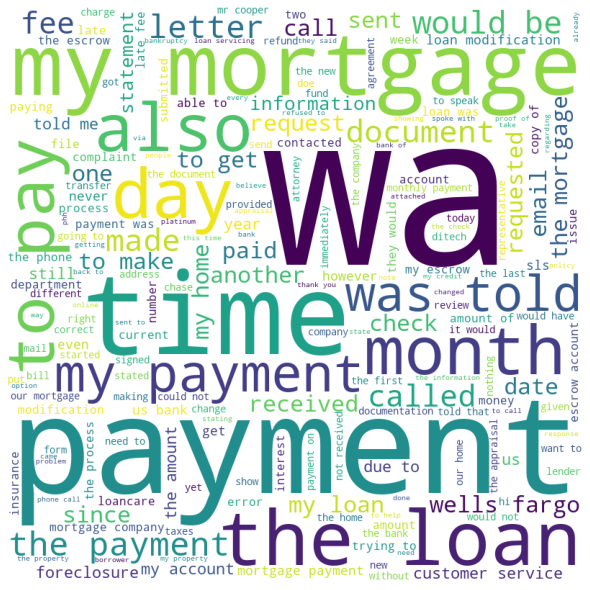

Cluster number: 6
i called usaa on xx/xx/ to help me resolve a debit card dispute for a transaction that took place on xx/xx/ in the amount of 6500.00 . the company i am disputing with has a class action lawsuit pending against them for bad practices etc. i specifically asked the representative it was too late to dispute the amount she said no. she said she could dispute it for me with out any problem which she did and gave me provisional credit. she then told me i needed to write a letter to ensure they got my side of the story while they investigated. i wrote a long letter to explain everything .... i received the provisional credit on xx/xx/ and patiently waited for the results of the dispute after id gathered my evidence and wrote my letter as instructed only to hear back from them 3 weeks later on xx/xx/ saying my dispute was filed too late and they would be removing the provisional credit without even investigating. this seems crazy to me as i am sure there should have been train

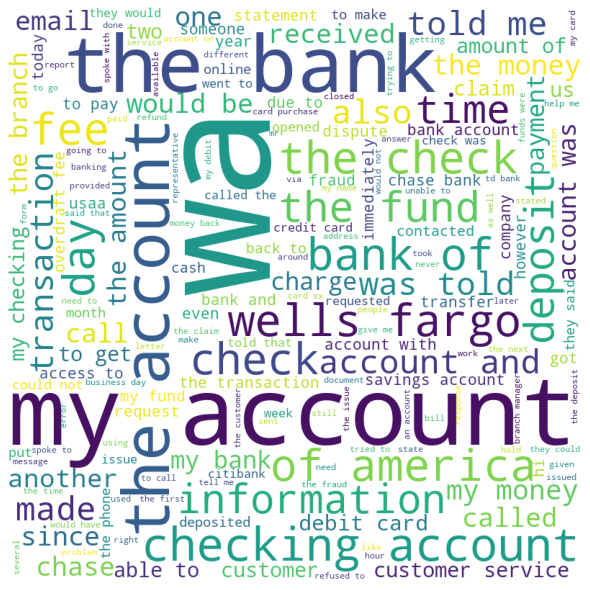

Cluster number: 7
i applied for a business credit card on xx/xx/ and called in on apparently there was an issue with my social security number. the first woman was and i was told that i was denied for reasons such as 1 chase card balances grew too fast compared to limit/time on file amount was out of a limit 2 too many active/too much available credit i had a new credit cards opened xx/xx/ and chase xx/xx/ a in xx/xx/ and a in xx/xx/ 3 business too new 2 months 4 too many recent requests for credit or reviews of my credit only three in 5 months one for a car and two for the credit cards i was told that paying down the credit on my chase card would help in a reconsideration and payed down about out of the . was still denied a second time. with more reasons some which were different. for the recon reasons 1 too many accts with balances i use my credit cards for everyday spending so 2 cards with balances of and with out of limit out of but has 0 apr and the chase with . 2 business too new

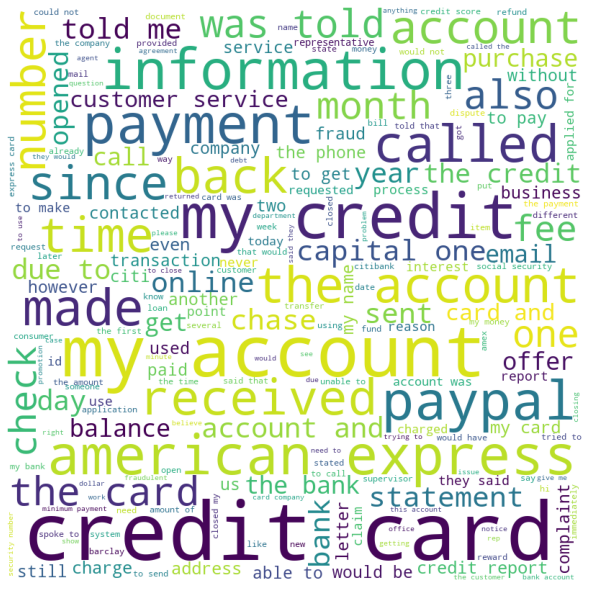

Cluster number: 8
trying to locate a cd from a failed bank that was acquired in 2014 by or cit bank.

Number of entries: 310


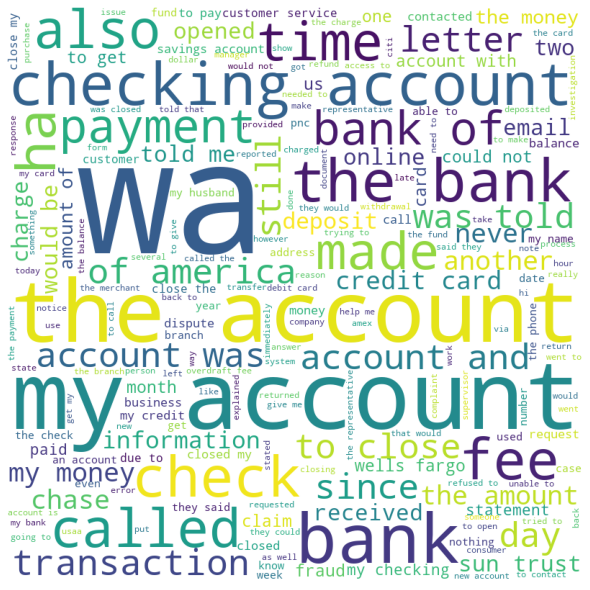

Cluster number: 9
sent multiple letters asking for verification of this account and never received any documents which supports this negative reporting on my credit.

in early xx/xx/ xx/xx/ and on xx/xx/. i have sent in three ftc/identity theft reports along with the account name account numbers and inquiries that do not belong to me. transunion is allowing a 300.00 and 500.00 to continue reporting on my credit file. i do not know where they originated from and i do not possess an inquiry for either account. i have submitted these accounts as fraudulent sending in the proper documentation and transunion and are refusing to remove them. is the only bureau that fixed the problem immediately. prior to this situation my credit was stellar and now both accounts are reporting as late payments and my credit is being ruined. i need this fixed as soon as possible. i did recently move into another apartment i am not sure if some of my information was stolen. in the past.

 noticed 9 items totali

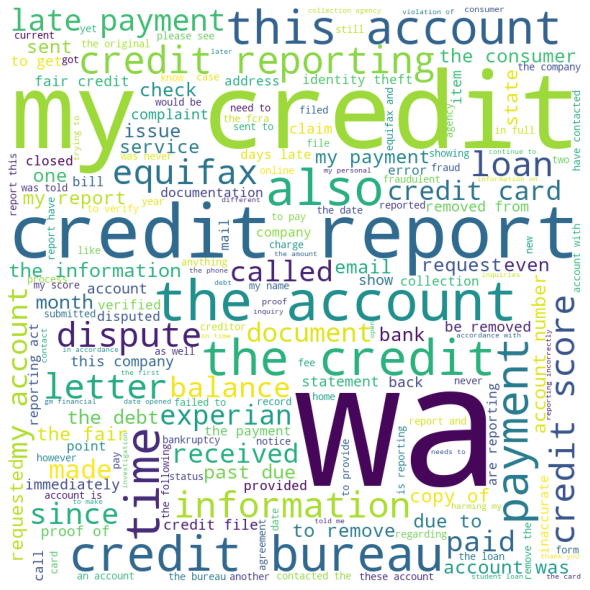

Cluster number: 10
Number of entries: 32


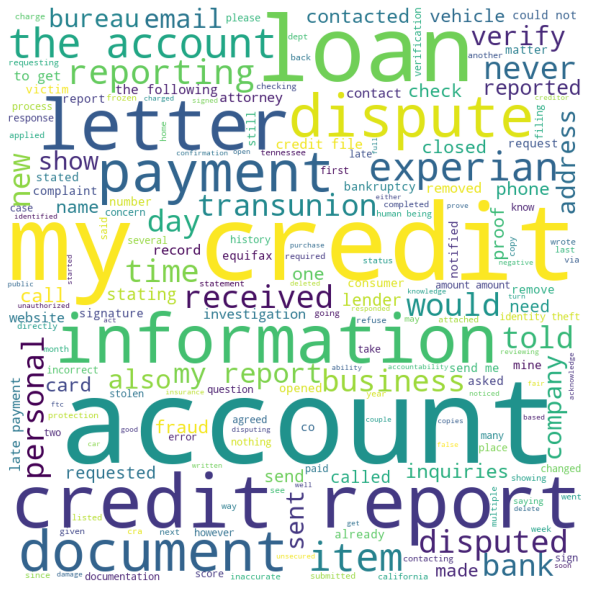

Cluster number: 11
i lost my job and yall got the car bk so y am i charged so much

in  i purchased a brand new from in new york - with chrysler capital as the lender. unfortunately while i did not want to purchase this vehicle my other vehicle had broken down and i needed transportation to and from work. my interest rate is 23.07 and chrysler capital refuses to work with me. the term of my loan is 80 months. i have been paying on the vehicle for four years and i still owe 24000.00 . given the high interest rate it is impossible to make the monthly payment on time and because so much is owed on the vehicle no other lender is willing to refinance it. in addition this is ruining my credit. i have requested a copy of my credit score from when the vehicle was purchased from both the lender and the dealer. however neither party will furnish same. prior to purchasing the vehicle i had inquired about a used vehicle from another dealer also financed through chrysler capital with an interest ra

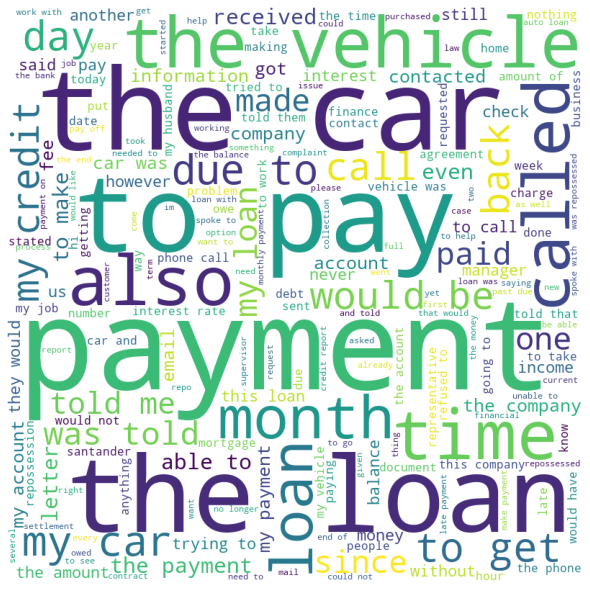

Cluster number: 12
i took out a installment loan with integra in xx/xx/ i reached out to company asking for help over the month of xx/xx/ as i was not able to make my payment. i was assured that my next payment would not be due until xx/xx/. on xx/xx/ the debited my bank account which caused me a overdraft fee. i instantly contacted them. was assured they would refund my payment as well as my overdraft fee in 2-3 business days. on xx/xx/ i reached back out to be advised they would issue my payment back but not my overdraft that would be credited toward my balance. on monday xx/xx/ i followed up to be told it takes 2 full business days for the payment to clear and then time to process refund but that it was on it s way. i was told this again tuesday and on wednesday i was told it had been processed and on it s way to my bank on thursday i reached out again to be told that they re working to resolve the issue ... no longer stating i would receive a refund but that the supervisor couldn t

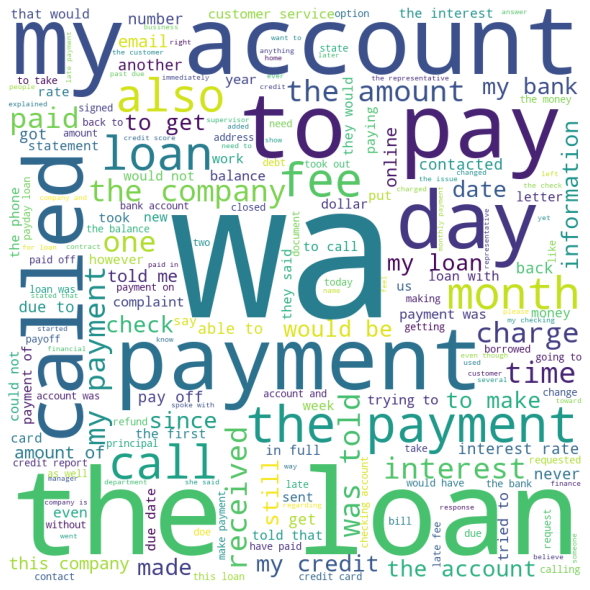

Cluster number: 13
Number of entries: 318


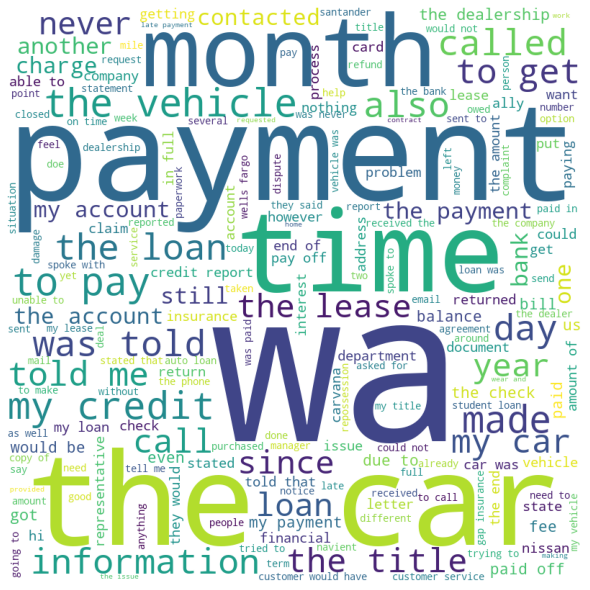

Cluster number: 14
Number of entries: 440


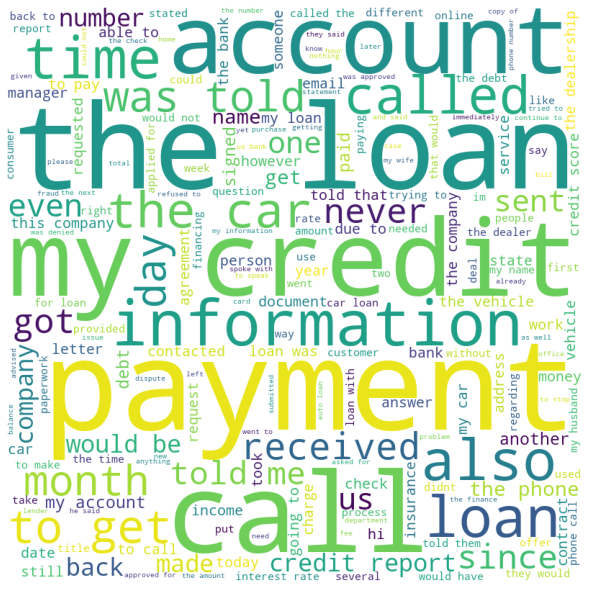

Cluster number: 15
i opened my cash app mobile account about a year ago. this company is also affiliated with square company. cash app has poor communication service. they do not have a toll free phone number to even contact them about your account. recently around xx/xx/ there was a problem with fees being deducted from monies that were being sent to me from family and friends through the cash app. i contacted cash app via email their " several times to find out what the fees were for and never received any response until months later i reached out to the company via around xx/xx/ asking for customer service assisting regarding these fees being deducted every time i received monies through app either by payroll/direct deposit or through friends and family. after contacting this company via they communicated someone from their support team would be contacting me. on xx/xx/ someone emailed me from their company about something totally unrelated my issue so i reach out again to them on s

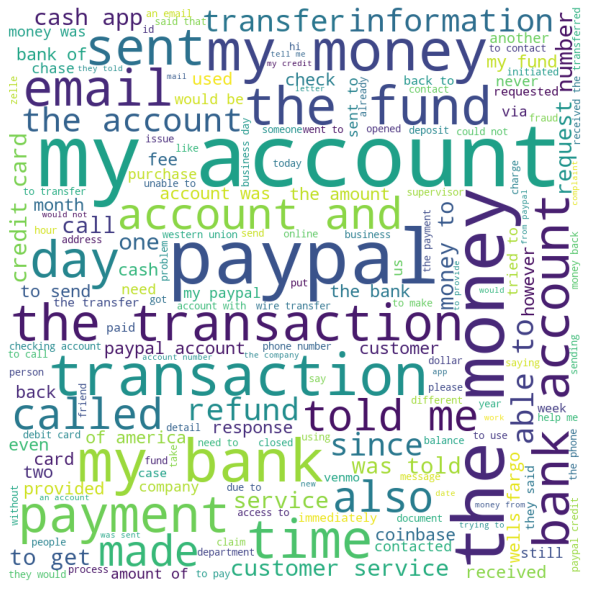

Cluster number: 16
i have documentation that national credit adjusters account number reduced total do from to and i put towards the and have been paying by weekly without a missed payment therefore my total should be approximately left on my balance just need it to be corrected on my credit report and i will be contacting national credit adjusters as well to get this corrected. i can send you the documentation that i have if needed.

i have made contact with and concerning this debt. i have repeatedly informed them that they were filing the insurance claim with incorrectly and they refuse to file it correctly. i have made contact with and was informed that they have not filed the claim correctly and that is the reason why they have not paid the claim. refuse to file the claim according to rules and guidelines.

portfolio recovery va to whom it may concern due to your erroneous reporting to the credit bureau s the highly negative impact on my personal credit report. please be advised t

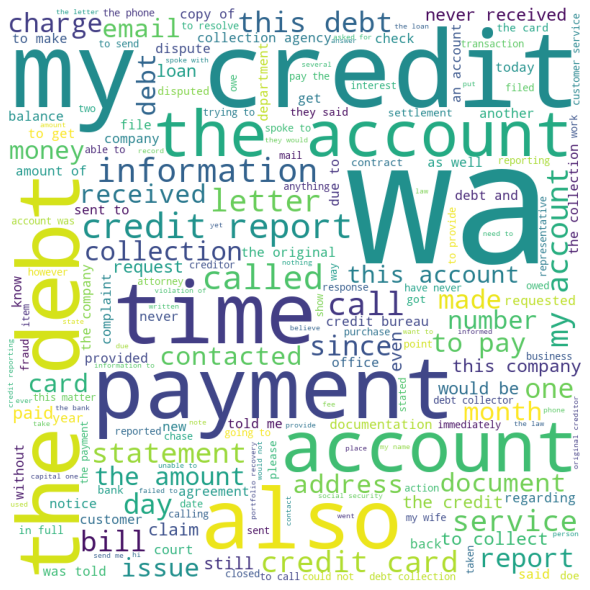

Cluster number: 17
Number of entries: 454


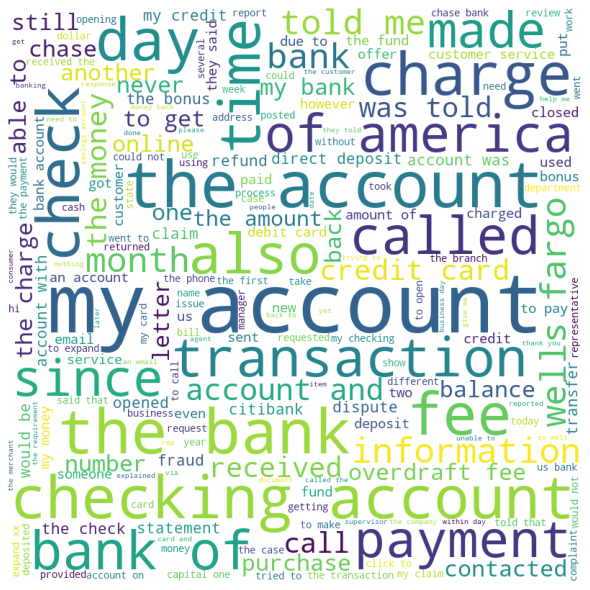

Cluster number: 18
 performed and unauthorized inquiry on my credit on . they issued a letter stating the inquiry would equifax has not removed it so i am filing a complaint against both companies.

on xx/xx/i had a hard report on my account for citibank i don t bank with citibank i don t have a citibank credit card on txx/xx/ i had a hard investigation on my credit report from in i do not have nor asked for them to look in anyting so i m questioning this

these credit inquiries were unauthorized and need to be removed from my credit report immediately.

 pulled my equifax report on . issued a letter on xx/xx/ saying they would remove the inquiry. equifax was provided a copy of the letter after 30 days went by and the inquiry not being removed. equifax stated did not file the removal correctly and they can t remove with a copy of the paper letter so i am filing a complaint against both companies.

i have contacted experian to remove the inquiries off my record that i dont recognize and

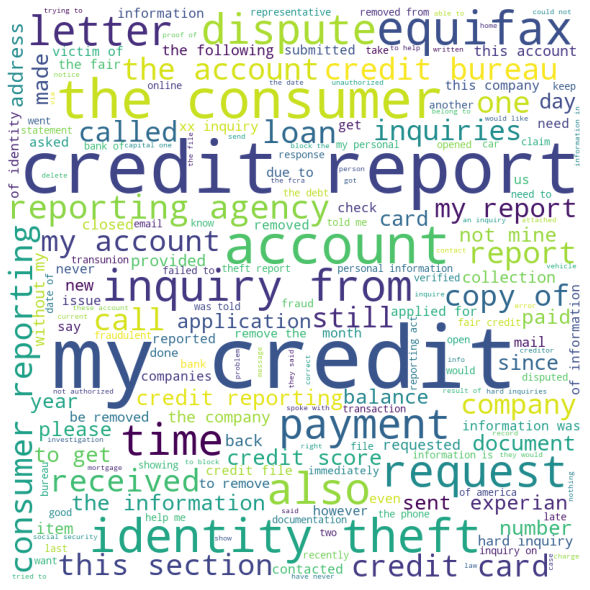

Cluster number: 19
i was called by everest receievable services saying that they were collecting a debt that i had no awareness of. when i asked for more information i had to verify my address and the last four digits of my social security. the agent then told me that i owed just over 2000.00 from a credit account. i told the agent that i have never had a credit account and that it was not my debt. he stated that the debt was from . i again stated that the debt was not mine. he said i would have to complete a fraud form and he would send it out. once i got off the phone with him i immediately checked saw that i have never opened a credit account with them then i went to and ordered a credit report and score the documents showed no account and nothing in collections. i am extremely concerned now that this was a scam to get my address and last four digits of my social.

i did created a complain about the difficult and challenges i was having with with debt issue back in xx/xx/ who hired 

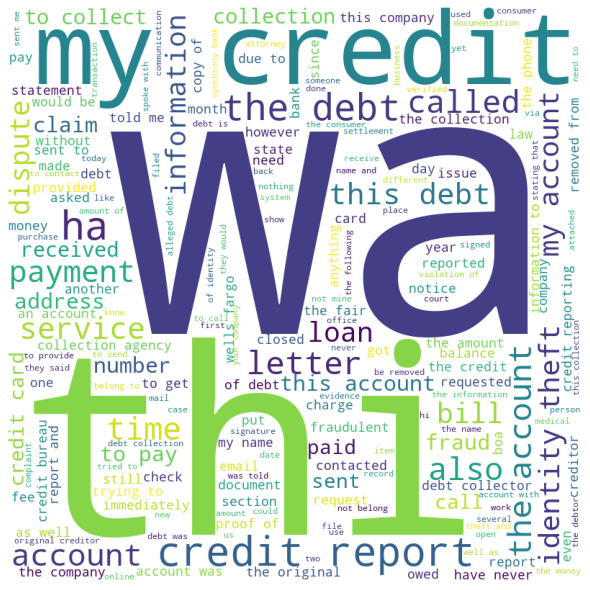

In [9]:
from wordcloud import WordCloud
import nltk
from nltk.corpus import stopwords
import random

#if it's your first time running with these stopwords, run the following line aswell:
#nltk.download('stopwords')

stopwords = set(stopwords.words('english'))
stopwords.add('xx')

for i in range(0,number_clusters):
    all_words = ''
    print('Cluster number: '+str(i))
    amount = 0
    for index, row in df_result.iterrows():
        if row[0] == i:
            all_words += ' ' + row['Consumer complaint narrative']
            rand = random.randint(1,200)
            amount += 1
            if(rand == 1):
                print(row['Consumer complaint narrative'] + '\n')
    wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(all_words) 
    print('Number of entries: ' + str(amount))
    plt.figure(figsize = (8, 8), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.show() 
